## Assignment 3 - Social Signals in Dynamic Data

Jie Yan 301407004

Use of External Libraries:

Matplotlib: https://matplotlib.org/

NumPy: https://www.numpy.org/

Pandas: https://pandas.pydata.org/

Scikit-learn: http://scikit-learn.org/

tslearn: https://tslearn.readthedocs.io/en/stable/index.html

Task One - Use OpenFace to extract the features you need from the dataset 

In [2]:
# import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import subprocess as sp
import glob as gb
import os
import stat
import shutil
import re

# import functions from tslearn
from tslearn.utils import to_time_series_dataset
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.neighbors import KNeighborsTimeSeriesClassifier

# import functions from sklearn
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix

d:\programs\python\python38\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
# remove all data where the # of successfully recognized frames
# is below a threshold, say 60%
def remove_invalid_data(f):
    # read in the csv file
        df = pd.read_csv(f)

        # strip while spaces before and after column names
        df.columns = df.columns.str.strip()

        # the # of frames in total
        nfr = df.shape[0]

        # the # of frames successfully recognized
        try:
            nsuc = df['success'].value_counts()[1]
        except KeyError:
            nsuc = 0

        # remove this csv file if it is mostly unsuccessful
        if nsuc/nfr < 0.8:
            os.remove(f)

# a function that creates the dataset
# dpath - the output directory of the dataframe
# gpath - the directory of all GIFs

def create_dataset(dpath, gpath):
    
    # extract features such as FACS, gaze, and head orientation

    # check if the path of GIFs exists
    if not os.path.exists(gpath):
        raise FileNotFoundError('The directory of GIFs does not exist!')

    # create the path of dataset if it doesn't exist
    if not os.path.exists(dpath):
        os.makedirs(dpath)

    # get the full path of the FeatureExtraction.exe
    cmd = shutil.which('FeatureExtraction')

    # skip this step if NO FeatureExtraction found in the system
    if cmd == None:
        raise FileNotFoundError('NO FeatureExtraction found in the system!')
        
    # get the list of first 500 files

    # compile a regualr expression for filtering
    pat = re.compile('\D*[1-4]?\d?\d[.]gif$')

    # use this re.Pattern object to match the file names
    lst = [f for f in gb.glob(os.path.join(gpath,'*')) if pat.match(f)]

    # extract features from each file
    for f in lst:
        try:
            sp.call([cmd, '-f', f, '-pose','-aus','-gaze','-out_dir',dpath])
        except Exception as e:
            print('Failed to process the file:' + f + '!')
            print(e)

    # clean all log files in the output directory
    for f in gb.glob(os.path.join(dpath,'*.txt')):
        os.remove(f)

    # remove all csv files that probably do not contain a face
    for f in gb.glob(os.path.join(dpath,'*.csv')):
        remove_invalid_data(f)

# create the dataset

# set the path of the dataset
dpath_happy = os.path.join('Smiles_Dataset','happy')
dpath_nervous = os.path.join('Smiles_Dataset','nervous')

# set the path of GIFs
gpath = os.path.join('GIFGIF','happiness')
    
# ONLY run this function for the first time
# This function can be very time-consuming!
# Also, make sure the directory that includes 
# the executable FeatureExtraction has been added to your PATH!
# so that FeatureExtraction could be found!
#try:
#    create_dataset(dpath, gpath)
#except Exception as e:
#    print(e)

In [29]:
# a function that data sanitization
# path - the .csv file path
# returns a cleaned dataframe

def clean_csv(path):
    
    # check the existence of the path
    if not os.path.exists(path):
        raise FileNotFoundError('The .csv file:%s does not exist!' % (path) )
        
    # read in the .csv file
    df = pd.read_csv(path)
    
    # strip the white spaces before and after column names
    df.columns = df.columns.str.strip()
    
    # create a filter that filters out all unrecognized frames
    filt = df['success'] != 1
    
    # drop these unrecognized frames
    df.drop(index=df[filt].index, inplace=True)
    
    # keep only selected features
    
    # selected features for classification
    df_features = pd.concat([df.loc[:,'frame':'gaze_angle_y'], df.loc[:,'pose_Tx':'pose_Rz'],
                             df.loc[:,'AU01_r':'AU45_r']])
    
    # retrun the dataframe with selected features
    return df_features

# A function that aggregate all .csv files into one data structure
# path - the directory where all .csv files reside
# returns the aggregated numpy.ndarray of time series format,
# as required by tslearn, and a list of corresponding file names 

def aggregate_data(path):
    
    # check the existence of the path
    if not os.path.exists(path):
        raise FileNotFoundError('The directory of the dataset for GIFs does not exist!')
        
    # get the list for all .csv files
    lst = gb.glob(os.path.join(path, '*.csv'))

    # create an empty list to hold each time series
    ts_lst = []
    
    # create an empty list to hold each corresponding file name
    f_lst = []
    
    # process each .csv file
    for f in lst:
        
        # read the .csv file and remove unsuccessfully recognized frames
        df = clean_csv(f)
        
        # remove 2D and 3D locations of eye landmarks
        # df.drop(columns=df.loc[:, 'eye_lmk_x_0':'eye_lmk_Z_55'].columns, inplace=True)
        
        # extract desired features
        df_features = df.loc[:,'gaze_0_x':'AU45_r']
        
        # convert to a numpy.ndarray
        np_features = df_features.to_numpy()
        
        # filter out empty entries
        if len(np_features) != 0:
            
            # append the extracted features to the list
            ts_lst.append(np_features)
        
            # append the corresponding file name to the list
            f_lst.append(os.path.basename(f)[:-4])
        
    # return the resulting numpy.ndarray
    return ts_lst, f_lst

# aggregate all .csv files into a numpy.ndarray
# of time series format
happy_features_lst, happy_files_lst = aggregate_data(dpath_happy)
nervous_features_lst, nervous_files_lst = aggregate_data(dpath_nervous)

# print each element in the array
for idx, e in enumerate(happy_features_lst + nervous_features_lst):
    if e.shape[0] == 0:
        print(f'#{idx}-{e.shape}')

# create our dataset
X = np.array(happy_features_lst + nervous_features_lst)
y = np.concatenate([np.ones(len(happy_features_lst)), np.zeros(len(nervous_features_lst))])

# split our dataset into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, shuffle=True, random_state=0)

# convert to time series
# and scale the features

# for the training set
# convert to the time series format required by tslearn
X_train_ts = to_time_series_dataset(X_train)
    
# scale the features so that each output time series has zero mean and unit variance
# Optional~
X_train_ts = TimeSeriesScalerMeanVariance().fit_transform(X_train_ts)

# for the test set
# convert to the time series format required by tslearn
X_test_ts = to_time_series_dataset(X_test)
    
# scale the features so that each output time series has zero mean and unit variance
# Optional~
X_test_ts = TimeSeriesScalerMeanVariance().fit_transform(X_test_ts)

Task Two - Use a distance metric that is suited for sequential data for clustering (K-Means or GMM)

In [31]:
# create a function that tries different values of k
# and returns the corresponding silhouette scores
# features - the features used for clustering
# max_k - the maximum value of k to test
# seed - the random state of the K-Means 
# returns a tuple that consists of two lists
# one is for the k values, and the other
# is for the corresponding silhouette values

def find_k_vs_ss(features, max_k, seed):
    
    # create a list for k values
    k_lst = []
    
    # create a list for the corresponding silhouette scores
    ss_lst = []
    
    # iterate over each possible k
    for k in range(2, max_k + 1):
        
        # add this k value to the list
        k_lst.append(k)
        
        # create a TimeSeriesKMeans model using the metric of DTW
        km = TimeSeriesKMeans(n_clusters=k, metric='dtw', n_init=5, random_state=seed)
        
        # fit this model to data
        labels = km.fit_predict(features)
        
        # compute the silhouette score
        ss = silhouette_score(features, labels, metric="dtw")
        
        # add the silhouette score to the list
        ss_lst.append(ss)
        
    # return the results
    return (k_lst,ss_lst)

# compute the silhouette scores for different values of k
# just for reference, seems useless
k,ss = find_k_vs_ss(X_train_ts, 5, 0)

# plot a diagram to visualize the results
plt.plot(k, ss, 'k-')

# title the diagram
plt.title('The silhouette score for different k',fontdict={'fontsize':16},loc='center')

# turn on the grid
plt.grid(True)

# show the plot
plt.show()

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

The silhouette score for different k

Uncomment the code to compute the silhouette scores in runtime.

Attention! This may take several hours!

The results are shown below!

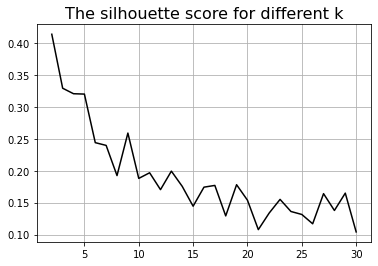

Obviously, the optimal value of k in this case is 2!

In [ ]:
# a function that clears the readonly bit and reattempt the removal
def remove_readonly(func, path, _):
    # change the access permission to the file
    os.chmod(path, stat.S_IWRITE)
    # try a second attempt
    func(path)

# a function that group all GIFs according to their labels
# gpath - the path of all GIFs
# lst - the list of the names for each GIF
# labels - the corresponding labels for each GIF in the list
# This function creates different folders for different groups
# of GIFs and groups these GIFs together

def group_gifs(gpath, names, labels):
    
    # set the name for the root directory
    root = 'GIFGIF_Group'
    
    # create a root directory
    if not os.path.exists(root):
        os.mkdir(root)
    else:
        # remove all existing directories
        # clean up all the existing GIFs
        # if it does exist
        for f in gb.glob(os.path.join(root, '*')):
            if os.path.isdir(f):
                shutil.rmtree(f, onerror=remove_readonly)
            else:
                os.chmod(f, stat.S_IWRITE)
                os.remove(f)
                
    # create a directory for each group
    for l in set(labels):
        
        # join the path of the root directory
        # and the group directory
        gdir = os.path.join(root, f'Group-{l}')
        
        # create a folder for this group
        os.mkdir(gdir)
        
    # copy each GIF from the source directory
    # to the corresponding group directory
    for i, name in enumerate(names):
        
        # get the path of the directory for this group
        gdir = os.path.join(root, f'Group-{labels[i]}')
        
        # get the path of the source file
        sp = os.path.join(gpath, name + '.gif')
        
        # get the path of the destination file
        dp = os.path.join(gdir, name + '.gif')
        
        # copy the GIF file to this directory
        shutil.copyfile(sp, dp)
        
# get the index of the highest silhouette score
#ss_max_i = np.argmax(ss)

# get the optimal number of clusters
#k_opt = k[ss_max_i]

# print the results
#print(f'The optimal value of k is {k_opt} by silhouette scores')

# try different values of k
k_opt = 2

# create a TimeSeriesKMeans model with optimal k clusters
# with the distance metric of DTW
km = TimeSeriesKMeans(n_clusters=k_opt, metric='dtw', n_init=5, random_state=0)

# feed the data to the model and retrieve the predicted labels
labels = km.fit_predict(X_train_ts)

# group GIFs by their corresponding labels
# group_gifs(gpath, ts_names, labels)

In [ ]:
# recognize some social signals that underlie each emotional "category"
signals = {0:'toothy smile with head tilt', 1:'moderate smiles with shaking heads',
           2:'excitement with popped eyes'}

some social signals that underlie each emotional "category"

Cluster 0 - toothy smile with head tilt

Visualize by providing examples of these social signals:

4.gif

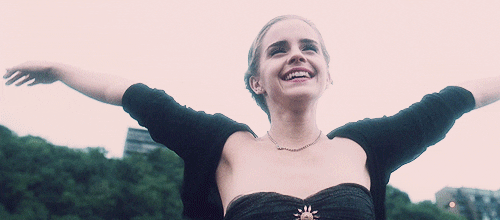

18.gif

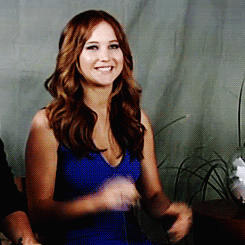

Cluster 1 - moderate smiles with shaking heads

Visualize by providing examples of these social signals:

17.gif

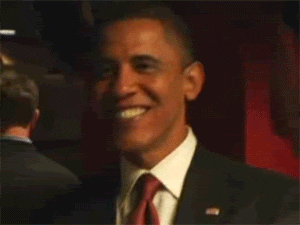

414.gif

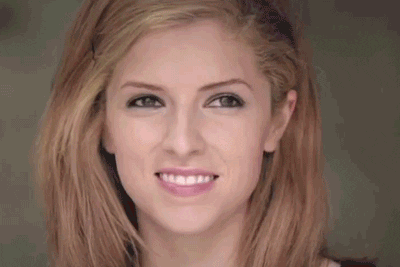

Cluster 2 - excitement with popped eyes

Visualize by providing examples of these social signals:

24.gif

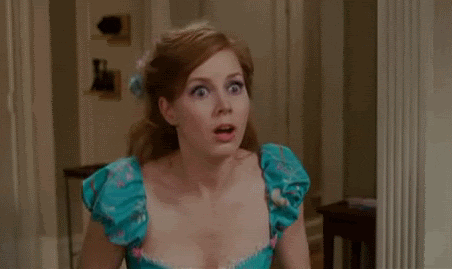

34.gif

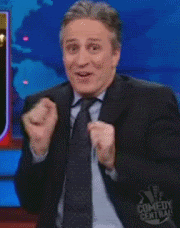

Task Three - use your created training and test set to test the performance

In [32]:
# a function that extracts features and labels
# from a Dataframe
# dpath - the directory of the dataset
# df - the input dataframe
# returns the time series data
# and corresponding labels
def extract_features(dpath, df):
    
    # check the existence of the path
    if not os.path.exists(dpath):
        raise FileNotFoundError('The directory of the dataset for GIFs does not exist!')
        
    # create a list of labels
    labels = []
    
    # create an empty list to hold each time series
    ts_lst = []
    
    # process each entry in the Dataframe
    for name, label, _ in df.to_numpy():
        
        # get the path of the corresponding dataset
        path = os.path.join(dpath,name + '.csv')
        
        # read the dataset
        df = pd.read_csv(path)
        
        # strip white spaces before and after column names
        df.columns = df.columns.str.strip()
        
        # remove 2D and 3D locations of eye landmarks
        df.drop(columns=df.loc[:, 'eye_lmk_x_0':'eye_lmk_Z_55'].columns, inplace=True)
        
        # extract desired features
        df_features = df.loc[:,'gaze_0_x':'AU45_r']
        
        # convert to a numpy.ndarray
        np_features = df_features.to_numpy()
        
        # append the extracted features to the list
        ts_lst.append(np_features)
        
        # append the corresponding label to the list
        labels.append(label)
    
    # convert to the time series format required by tslearn
    ts = to_time_series_dataset(ts_lst)
    
    # return the results
    return ts, labels
        
    
# a fucntion that splits a dataset into a training set and test set
# names - the list of file names
# labels - the corresponding labels
# this funciton returns two Dataframes,
# one for training and the other for testing
def split_trn_tst(names, labels):
    
    # create a dataframe to hold file names
    # and their corresponding labels
    df = pd.DataFrame({'names':names, 'labels':labels})
    
    # append a column to denote corresponding social signals
    df['signals'] = df['labels'].apply(signals.get)
    
    # create two dataframes to store the training set and test set
    df_trn = pd.DataFrame()
    df_tst = pd.DataFrame()
    
    # split each group into a training part and test part
    for i in set(labels):
        # create a filter
        filt = df['labels'] == i
        # split the dataset
        trn, tst = train_test_split(df.loc[filt], train_size=0.8, shuffle=True, random_state=0)
        # combine the dataset
        df_trn = df_trn.append(trn, ignore_index=True)
        df_tst = df_tst.append(tst, ignore_index=True)
        
    # return the results
    return df_trn, df_tst

# create a training set and test set
# df_trn, df_tst = split_trn_tst(ts_names, labels)

# get time series features and labels
# for both training set and test set
# ts_trn_X, ts_trn_y = extract_features(dpath,df_trn)
# ts_tst_X, ts_tst_y = extract_features(dpath,df_tst)

In [34]:
# model selection

# create a kNN model with the metric of DTW 
knn = KNeighborsTimeSeriesClassifier(metric="dtw")

# possible k values
pgrid = {"n_neighbors": list(range(1, 11))}

# 5-fold cross-validation for training
cv = KFold(n_splits=5, shuffle=True, random_state=0)

# create a searcher for the optimal value of k
grid_search = GridSearchCV(estimator=knn, n_jobs=6, param_grid=pgrid, cv=cv)

# kNN model tuning with the training set
grid_search.fit(X_train_ts, y_train)

# get the best parameter from the grid search
k_opt = grid_search.best_params_['n_neighbors']

# get the optimal value of k
print(f'The optimal value of k is {k_opt} for time series kNN~')

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [35]:
X_train_ts.shape

(272, 795, 31)

In [ ]:
# set two categories
k_opt = 2

# create a kNN model with the optimal value of k
knn_opt = KNeighborsTimeSeriesClassifier(n_neighbors=k_opt, metric="dtw", n_jobs=6)

# fit the kNN model to the training set
knn_opt.fit(X_train_ts, y_train)

# predict the labels
trn_y_predict = knn_opt.predict(X_train_ts)
tst_y_predict = knn_opt.predict(X_test_ts)

In [ ]:
# get the training accuracy
# use 5-fold cross-validation
cvs_trn = cross_val_score(knn_opt, X_train_ts, y_train, cv=5, scoring="accuracy")

# report the mean accuracy of training
print(f'The average accuracy of training is {np.mean(cvs_trn)*100:.2f}%')

# compute the confusion matrix
cm_trn = confusion_matrix(y_train, trn_y_predict)

# display the confusion matrix
print('The confusion matrix for training:')
print(cm_trn)

# plot the confusion matrix
# as a seaborn heatmap

# plot the heat map
heat_map = sns.heatmap(cm_trn, annot=True, cmap='hot')

# set the tick labels
heat_map.set_xticklabels(['Predicted Nervous', 'Predicted Happy'],
                         fontdict={'horizontalalignment': 'center'})

heat_map.set_yticklabels(['True Nervous', 'True Happy'],
                         fontdict={'verticalalignment': 'center'})

# set the title
heat_map.set_title('The Confusion Matrix')

# show the plot
plt.show()

In [ ]:
# get the testing accuracy
# use 5-fold cross-validation
cvs_trn = cross_val_score(knn_opt, X_test_ts, y_test, cv=5, scoring="accuracy")

# report the mean accuracy of training
print(f'The average accuracy of testing is {np.mean(cvs_trn)*100:.2f}%')

# compute the confusion matrix
cm_tst = confusion_matrix(y_test, tst_y_predict)

# display the confusion matrix
print('The confusion matrix for testing:')
print(cm_tst)

# plot the confusion matrix
# as a seaborn heatmap

# plot the heat map
heat_map = sns.heatmap(cm_tst, annot=True, cmap='hot')

# set the tick labels
heat_map.set_xticklabels(['Predicted Nervous', 'Predicted Happy'],
                         fontdict={'horizontalalignment': 'center'})

heat_map.set_yticklabels(['True Nervous', 'True Happy'],
                         fontdict={'verticalalignment': 'center'})

# set the title
heat_map.set_title('The Confusion Matrix')

# show the plot
plt.show()

Discussion Of Limitations

Same as assignment 2, I think the biggest limitation here is again the dimensionality. After removing 2D and 3D landmarks of eyes, there are still 31 dimensions left. What's more, the situation didn't improve much even with 23 dimensions, where only pose and AUs were used as features. It is very hard or even impossible to pinpoint the role each of these dimensions plays in the time series k-means clustering. I believe this leads to the difficulties when interpreting the typical social signals associated with each cluster. Actually, by taking a closer look, you may find a myriad of social signals out there in each cluster in terms of eyes, mouth, and head posture. I don't know if it is because I did it wrong or my dataset lacks in variance. However, from my personal experience in doing this assignment, It is hard to identify such common social signals that are largely evident across all GIFs in one cluster. Mathematically, the results are valid but they make little sense. Maybe, after a second thought, I would achieve a better result if I did more feature engineering (i.e. only use those features that are representative). This is possible by making the purpose of clustering more specific, like only distinguishing between the up and down and left and right movement of head, in which case we only need to use pose features. So, I believe this assignment would be more successful if the objects being processed were one-dimensional sounds instead of GIFs. DTW might play a more significant role in this case. For example, we could try detecting laughter in sounds in this assingment. Besides, I think the dataset GIFGIF itself is not homogeneous at all. A lot of GIFs look more like excitement, shock, or suprise rather than happiness. What's more, a lot of GIFs are not valid human faces, even if some are surprisingly recognizable by openface like the one below.

happiness: 64.gif
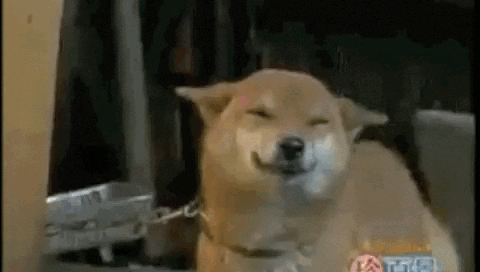

PS: Openface detects perfect AU6 and AU12! It is smiling~!